In [94]:
!pip install pymongo
!pip install faker
!pip install unidecode
!pip install pandas
!pip install openpyxl
!pip install apyori
!pip install ipywidgets

In [54]:
from faker import Faker
from pymongo import MongoClient
from datetime import datetime
import pandas as pd
import random

### Faker será usado para criar valores fictícios

In [55]:
fake = Faker('pt_BR')

### MongoDB

In [56]:
uri = 'mongodb://localhost/'
db = MongoClient(uri)['vendas']

# a quantidade de usuários define também a quantidade representantes
QUANTIDADE_USUARIOS = 10

# Criar usuários que serão usados como representantes

## executar usando shell !!!
    "python manage.py shell"

e depois colar o resultado abaixo

In [11]:
from unidecode import unidecode

print('from django.contrib.auth.models import User')

for i in range(QUANTIDADE_USUARIOS):
  first_name = fake.first_name()
  last_name = fake.last_name()
  username = unidecode(first_name.split()[0].lower()) + '.'
  username += unidecode(last_name.split()[-1].lower())
  email = username + '@example.com'
  print(f"User.objects.create_user(username='{username}', email='{email}', password='123', is_staff=True, first_name='{first_name}', last_name='{last_name}', )")
print()

from django.contrib.auth.models import User
User.objects.create_user(username = 'vitoria.mata', email = 'vitoria.mata@example.com', password = '123', is_staff = True, first_name = 'Vitória', last_name = 'da Mata', )
User.objects.create_user(username = 'agatha.mota', email = 'agatha.mota@example.com', password = '123', is_staff = True, first_name = 'Agatha', last_name = 'da Mota', )
User.objects.create_user(username = 'agatha.souza', email = 'agatha.souza@example.com', password = '123', is_staff = True, first_name = 'Agatha', last_name = 'Souza', )
User.objects.create_user(username = 'lavinia.freitas', email = 'lavinia.freitas@example.com', password = '123', is_staff = True, first_name = 'Lavínia', last_name = 'Freitas', )
User.objects.create_user(username = 'larissa.luz', email = 'larissa.luz@example.com', password = '123', is_staff = True, first_name = 'Larissa', last_name = 'da Luz', )
User.objects.create_user(username = 'otavio.carvalho', email = 'otavio.carvalho@example.com', passw

# Criar representantes e clientes
necessita de usuários cadastrados

In [12]:
representantes = []
for user in db['auth_user'].find({ 'id': { '$gt': 1 }}):
  clientes = []
  for i in range(random.randrange(1, 6)):
    clientes.append({
      'id': i + 1,
      'nome': f'{fake.company().upper()} {fake.company_suffix().upper()}',
      'cnpj': fake.cnpj(),
      'contato': fake.name(),
      'telefone': fake.cellphone_number(),
      'email': fake.email(),
      'endereco': {
        'logradouro': fake.street_address(),
        'bairro': fake.bairro(),
        'cidade': fake.city(),
        'estado': fake.estado_sigla(),
        'cep': fake.postcode(formatted=True),
      }
    })
  representantes.append({
    'id': user['id'],
    'nome': f"{user['first_name']} {user['last_name']}",
    'cpf': fake.cpf(),
    'nivel': 'CONFIRMAR',
    'user_id': user['id'],
    'clientes': clientes,
  })
representantes

[{'id': 2,
  'nome': 'Vitória da Mata',
  'cpf': '086.925.743-92',
  'nivel': 'CONFIRMAR',
  'user_id': 2,
  'clientes': [{'id': 1,
    'nome': 'MOURA S/A',
    'cnpj': '29.468.031/0001-53',
    'contato': 'Vitor Hugo Barbosa',
    'telefone': '+55 (079) 91711-6597',
    'email': 'catarina97@example.net',
    'endereco': {'logradouro': 'Colônia Nunes, 3',
     'bairro': 'Candelaria',
     'cidade': 'Souza',
     'estado': 'CE',
     'cep': '13642-215'}},
   {'id': 2,
    'nome': 'DA ROCHA S.A.',
    'cnpj': '85.731.240/0001-19',
    'contato': 'Sophie Sales',
    'telefone': '+55 91 98153 8215',
    'email': 'erodrigues@example.org',
    'endereco': {'logradouro': 'Conjunto de Pires',
     'bairro': 'Boa União 1ª Seção',
     'cidade': 'Porto da Mata',
     'estado': 'SE',
     'cep': '70639660'}},
   {'id': 3,
    'nome': 'DA CONCEIÇÃO PINTO E FILHOS - EI',
    'cnpj': '70.359.814/0001-00',
    'contato': 'Gabrielly Campos',
    'telefone': '+55 (52) 9 3700 3137',
    'email': 'costel

In [ ]:
db['venda_representante'].delete_many({})
db['venda_representante'].insert_many(representantes)

### estoque

In [37]:
xls = pd.read_excel('estoque.xlsx')

In [38]:
estoques = []
for i, e in enumerate(xls.to_dict('records')):
  estoques.append({
    'id': i + 1,
    'produto': {
      'marca': {
        'nome': e['marca'],
      },
      'categoria': {
        'titulo': e['categoria'],
      },
      'descricao': e['descricao'],
    },
    'quantidade': e['quantidade'],
    'preco_compra': e['preco_compra'],
    'preco_venda': e['preco_compra'] * 2,
  })
estoques

[{'id': 1,
  'produto': {'marca': {'nome': 'Bot-Art'},
   'categoria': {'titulo': 'Xicaras'},
   'descricao': 'Leiteira Texas Media 550ml'},
  'quantidade': 1000,
  'preco_compra': 14.925,
  'preco_venda': 29.85,
  '_id': ObjectId('66399227489da24ed18e99c7')},
 {'id': 2,
  'produto': {'marca': {'nome': 'Bot-Art'},
   'categoria': {'titulo': 'Xicaras'},
   'descricao': 'Xicara Café c/ pires Veneza'},
  'quantidade': 1000,
  'preco_compra': 7.345,
  'preco_venda': 14.69,
  '_id': ObjectId('66399227489da24ed18e99c8')},
 {'id': 3,
  'produto': {'marca': {'nome': 'Renata'},
   'categoria': {'titulo': 'Biscoitos, Bolos e Torradas em Sache'},
   'descricao': 'Sache Biscoito AMANTEIGADO COCO RENATA SACHÊ 9G 2X2 CAIXA 280 und'},
  'quantidade': 1000,
  'preco_compra': 43.935,
  'preco_venda': 87.87,
  '_id': ObjectId('66399227489da24ed18e99c9')},
 {'id': 4,
  'produto': {'marca': {'nome': 'Renata'},
   'categoria': {'titulo': 'Biscoitos, Bolos e Torradas em Sache'},
   'descricao': 'Sache de Bi

In [ ]:
db['venda_estoque'].delete_many({})
db['venda_estoque'].insert_many(estoques)

# Pedidos

### base original

In [57]:
df_ori = pd.read_csv('/home/oscar/escola/dados/Sales_Product_Combined.csv')
df_ori

,Order ID,Product,Quantity Ordered,Price,Order Date,Time,Purchase Address,City,Product Type
0,176558,USB-C Charging Cable,2,11.95,19-04-2019,8:46 AM,"917 1st St, Dallas, TX 75001",Dallas,Cable
1,176559,Bose SoundSport Headphones,1,99.99,07-04-2019,10:30 PM,"682 Chestnut St, Boston, MA 02215",Boston,Headphones
2,176560,Google Phone,1,600,12-04-2019,2:38 PM,"669 Spruce St, Los Angeles, CA 90001",Los Angeles,Phone
3,176560,Wired Headphones,1,11.99,12-04-2019,2:38 PM,"669 Spruce St, Los Angeles, CA 90001",Los Angeles,Headphones
4,176561,Wired Headphones,1,11.99,30-04-2019,9:27 AM,"333 8th St, Los Angeles, CA 90001",Los Angeles,Headphones
...,...,...,...,...,...,...,...,...,...
185945,259353,AAA Batteries (4-pack),3,2.99,17-09-2019,8:56 PM,"840 Highland St, Los Angeles, CA 90001",Los Angeles,Batteries
185946,259354,iPhone,1,700,01-09-2019,4:00 PM,"216 Dogwood St, San Francisco, CA 94016",San Francisco,iPhone
185947,259355,iPhone,1,700,23-09-2019,7:39 AM,"220 12th St, San Francisco, CA 94016",San Francisco,iPhone
185948,259356,34in Ultrawide Monitor,1,379.99,19-09-2019,5:30 PM,"511 Forest St, San Francisco, CA 94016",San Francisco,Monitor


In [58]:
# quantidade por cidade
df_ori.groupby('City')['Quantity Ordered'].count().sort_values()

City
Austin            9905
Portland         12465
Seattle          14732
Dallas           14820
Atlanta          14881
Boston           19934
New York City    24876
Los Angeles      29605
San Francisco    44732
Name: Quantity Ordered, dtype: int64

### quantidades: Austin=9905, Boston=19934, San Francisco=44732

In [59]:
# renomeando campos
df_aux = df_ori.rename(columns={
  'Order ID': 'id', 
  'Product' : 'produto', 
  'Quantity Ordered': 'quantidade', 
  'Price': 'preco', 
  'Order Date': 'data',
  'Time': 'hora',
  'Product Type': 'categoria', 
  'Purchase Address': 'endereco', 
  'City': 'cidade',
})

# criando campo horário
df_aux['horario'] = pd.to_datetime(df_aux['data'] + ' ' + df_aux['hora'], format='%d-%m-%Y %I:%M %p')

# diminuindo quantidade de registros
df_aux['cidade'] = df_aux['cidade'].str.strip()
# df_aux = df_aux.query('horario.dt.year == 2019 and cidade == "San Francisco"')[
df_aux = df_aux.query('horario.dt.year == 2019 and cidade == "Austin"')[
  ['horario', 'produto', 'quantidade', 'preco']
]

### ajustando os valores

In [60]:
df = df_aux.sort_values('horario')

# campo auxiliar para aleatórios
df['rnd'] = [random.randrange(100) for _ in df.index]

# transferir 25% das vendas dos meses 3, 4 e 5 para os meses 9, 10 e 11
df['horario'] = df['horario'].mask(
  (df['horario'] > pd.to_datetime('01-03-2019', format='%d-%m-%Y')) & 
  (df['horario'] < pd.to_datetime('01-06-2019', format='%d-%m-%Y')) & 
  (df['rnd'] < 25), 
  df['horario'] + pd.DateOffset(months=6))

# transferir 20% das vendas do mês 12 para o mês 1
df['horario'] = df['horario'].mask(
  (df['horario'] > pd.to_datetime('01-12-2019', format='%d-%m-%Y')) & 
  (df['rnd'] < 20), 
  df['horario'] + pd.DateOffset(months=-11))

# distribuir aleatóriamente os registros em 5 anos
df['rnd'] = [random.randrange(100) for _ in df.index]
df['horario'] = df['horario'].mask(
  (df.rnd < 25), 
  df['horario'] + pd.DateOffset(years=2))
df['horario'] = df['horario'].mask(
  (df.rnd >= 25) & 
  (df.rnd < 50),
  df['horario'] + pd.DateOffset(years=3))
df['horario'] = df['horario'].mask(
  (df.rnd >= 50) & 
  (df.rnd < 75),
  df['horario'] + pd.DateOffset(years=4))
df['horario'] = df['horario'].mask(
  (df.rnd >= 75),
  df['horario'] + pd.DateOffset(years=5))

# campo auxiliar de data
df['data'] = pd.to_datetime(df['horario']).dt.date

# distribuir os itens do pedido
df['nota'] = df['horario'].dt.strftime('%Y%m%d-%M').str.slice(stop=10)

# permitir cálculo com o preço
df['preco'] = df['preco'].str.replace(',', '').astype(float)
df['preco'] = df.apply(lambda row: row['preco'] * 10 if row['preco'] < 80 else row['preco'], axis=1)
df['preco'] = df['preco'].round(2)

# calcular aleatóriamente quantidade, mas valores menores tem peso maior
pop = [i + 1 for i in range(40)]
wei = [i * i + 1 for i in range(40, 0, -1)]
df['quantidade'] = random.choices(pop, wei, k=len(df.index))
df['quantidade'] = (df['quantidade'] / (df['quantidade'] * df['preco'] / 10000 + 1).astype(int)).astype(int)
df['total'] = df['quantidade'] * df['preco']
df['total'] = df['total'].round(2)

# renomear produtos
prod = {
  'AA Batteries (4-pack)': 'P01',
  'AAA Batteries (4-pack)': 'P02',
  'Lightning Charging Cable': 'P03',
  'USB-C Charging Cable': 'P04',
  'LG Dryer': 'P05',
  'Apple Airpods Headphones': 'P06',
  'Bose SoundSport Headphones': 'P07',
  'Wired Headphones': 'P08',
  'iPhone': 'P09',
  'Macbook Pro Laptop': 'P10',
  'ThinkPad Laptop': 'P11',
  'LG Washing Machine': 'P12',
  '20in Monitor': 'P13',
  '27in 4K Gaming Monitor': 'P14',
  '27in FHD Monitor': 'P15',
  '34in Ultrawide Monitor': 'P16',
  'Google Phone': 'P17',
  'Vareebadd Phone': 'P18',
  'Flatscreen TV': 'P19',
}
df['produto'] = df.apply(lambda row: prod[row['produto']], axis=1)

df = df[['nota', 'data', 'horario', 'produto', 'quantidade']].sort_values('horario')
df

,nota,data,horario,produto,quantidade
47304,20210101-5,2021-01-01,2021-01-01 09:55:00,P01,1
32591,20210101-3,2021-01-01,2021-01-01 10:31:00,P08,4
71977,20210101-3,2021-01-01,2021-01-01 10:32:00,P06,13
76404,20210101-1,2021-01-01,2021-01-01 19:11:00,P02,3
30720,20210102-5,2021-01-02,2021-01-02 09:53:00,P02,3
...,...,...,...,...,...
44375,20241231-2,2024-12-31,2024-12-31 13:24:00,P03,14
48869,20241231-1,2024-12-31,2024-12-31 17:10:00,P04,9
35790,20241231-1,2024-12-31,2024-12-31 18:16:00,P01,1
40545,20241231-3,2024-12-31,2024-12-31 18:30:00,P01,11


In [61]:
# df.head()
# df.info()
# df[:20]
# df[-20:]
df.shape
# df_aux.shape
# df_aux[:20]
# df_aux[-20:]

(9903, 5)

In [62]:
# quantidade por mês
j = df[['horario', 'quantidade']]
j.index = df.horario
j.resample(rule='ME', on='horario')['quantidade'].sum()

horario
2021-01-31    2013
2021-02-28    1473
2021-03-31    1585
2021-04-30    1862
2021-05-31    1403
2021-06-30    1757
2021-07-31    2002
2021-08-31    2045
2021-09-30    2173
2021-10-31    3472
2021-11-30    2858
2021-12-31    2855
2022-01-31    2074
2022-02-28    1737
2022-03-31    1524
2022-04-30    1740
2022-05-31    1691
2022-06-30    1625
2022-07-31    1782
2022-08-31    1551
2022-09-30    2034
2022-10-31    3253
2022-11-30    2789
2022-12-31    2791
2023-01-31    1810
2023-02-28    1491
2023-03-31    1577
2023-04-30    1752
2023-05-31    1573
2023-06-30    1736
2023-07-31    1791
2023-08-31    1739
2023-09-30    2187
2023-10-31    3494
2023-11-30    2407
2023-12-31    2879
2024-01-31    2007
2024-02-29    1558
2024-03-31    1746
2024-04-30    1721
2024-05-31    1686
2024-06-30    1919
2024-07-31    1898
2024-08-31    1393
2024-09-30    2538
2024-10-31    3316
2024-11-30    2482
2024-12-31    2321
Freq: ME, Name: quantidade, dtype: int64

In [117]:
q = f'horario < "{datetime.now().date()}"'
df_ins = df.query(q).sort_values(['data', 'nota', 'produto'])

In [126]:
df_ins[-30:]

,nota,data,horario,produto,quantidade
134721,20240505-3,2024-05-05,2024-05-05 18:35:00,P17,5
128226,20240505-4,2024-05-05,2024-05-05 11:47:00,P01,5
133134,20240506-2,2024-05-06,2024-05-06 14:23:00,P08,29
134887,20240506-4,2024-05-06,2024-05-06 07:48:00,P03,5
129463,20240507-0,2024-05-07,2024-05-07 21:07:00,P15,8
122943,20240507-2,2024-05-07,2024-05-07 12:26:00,P06,7
134749,20240507-2,2024-05-07,2024-05-07 21:29:00,P11,9
120072,20240507-4,2024-05-07,2024-05-07 09:42:00,P04,4
119949,20240507-5,2024-05-07,2024-05-07 23:57:00,P03,24
128588,20240508-1,2024-05-08,2024-05-08 10:13:00,P02,6


In [128]:
df_ins.shape

(8180, 5)

# Preparar e Inserir Pedidos

In [185]:
representantes = list(db['venda_representante'].find())

estoques = {}
for e in db['venda_estoque'].find():
  estoques[f"P{e['id']:02}"] = e

In [186]:
def gen_pedido(i, itens_pedido, total, representantes, horario):
  representante = random.choice(representantes)
  cliente = random.choice(representante['clientes'])

  etapas = [{
    'id': 1,
    'etapa': 'criado',
    'horario': horario,
    'user_id': representante['id']
  }]
  etapa_id = 2
  if representante['id'] != 2:
    etapas.append({
      'id': etapa_id,
      'etapa': 'enviado',
      'horario': horario,
      'user_id': representante['id']
    })
    etapa_id += 1
  etapas.append({
    'id': etapa_id,
    'etapa': 'confirmado',
    'horario': horario,
    'user_id': 2
  })

  pedido = {
    'id': i,
    'etapa': 'confirmado',
    'etapas_pedido': etapas,
    'representante_id': representante['id'],
    'cliente': cliente,
    'horario': horario,
    'itens_pedido': itens_pedido,
    'total': round(total, 2)
  }

  return pedido


In [189]:
pedidos = []
itens_pedido = []
i = j = 0
nota = df_ins.iloc[0, 0]
horario = df_ins.iloc[0, 2]
prod_ant = ''
total = 0
for e in df_ins.itertuples():
  if nota != e.nota:
    i += 1
    pedido = gen_pedido(i, itens_pedido, total, representantes, horario)
    pedidos.append(pedido)
    itens_pedido = []
    j = 0
    prod_ant = ''
    total = 0
    nota = e.nota
    horario  = e.horario

  estoque = estoques[e.produto]
  total_prod = round(e.quantidade * estoque['preco_venda'], 2)
  total += total_prod
  if e.produto == prod_ant:
    itens_pedido[-1]['quantidade'] += e.quantidade
  else:
    j += 1
    item = {
      'id': j,
      'produto': estoque['produto'],
      'preco_compra': estoque['preco_compra'],
      'preco_venda': estoque['preco_venda'],
      'quantidade': e.quantidade,
      'total': total_prod
    }
    itens_pedido.append(item)
    prod_ant = e.produto

if nota != df_ins.iloc[0, 0]:
  pedido = gen_pedido(i + 1, itens_pedido, total, representantes, horario)
  pedidos.append(pedido)

In [190]:
from pprint import pprint
pprint(pedidos)

[{'cliente': {'cnpj': '20.547.693/0001-44',
              'contato': 'Dra. Maria Melo',
              'email': 'rodriguesthales@example.org',
              'endereco': {'bairro': 'Savassi',
                           'cep': '89976069',
                           'cidade': 'Souza de Fogaça',
                           'estado': 'MS',
                           'logradouro': 'Núcleo Vieira, 748'},
              'id': 1,
              'nome': 'GOMES - ME S/A',
              'telefone': '+55 94 96474 1938'},
  'etapa': 'confirmado',
  'etapas_pedido': [{'etapa': 'criado',
                     'horario': Timestamp('2021-01-01 19:11:00'),
                     'id': 1,
                     'user_id': 6},
                    {'etapa': 'enviado',
                     'horario': Timestamp('2021-01-01 19:11:00'),
                     'id': 2,
                     'user_id': 6},
                    {'etapa': 'confirmado',
                     'horario': Timestamp('2021-01-01 19:11:00'),
          

In [191]:
db['venda_pedido'].delete_many({})
db['venda_pedido'].insert_many(pedidos)

In [192]:
# atualizando controle do sequencial de pedidos
print(len(pedidos))
print(db['__schema__'].find_one({'name': 'venda_pedido'})['auto']['seq'])

db['__schema__'].update_one({'name': 'venda_pedido'}, {
  '$set': {
    'auto.seq': len(pedidos)
  }}, upsert=False)

print(db['__schema__'].find_one({'name': 'venda_pedido'}))

4821
4821
{'_id': ObjectId('6636a5166034bd29b7dcf81f'), 'name': 'venda_pedido', 'auto': {'field_names': ['id'], 'seq': 4821}, 'fields': {'cliente': {'type_code': 'object'}, 'etapa': {'type_code': 'string'}, 'etapas_pedido': {'type_code': 'array'}, 'horario': {'type_code': 'date'}, 'id': {'type_code': 'int'}, 'itens_pedido': {'type_code': 'array'}, 'representante_id': {'type_code': 'int'}, 'total': {'type_code': 'double'}}}


In [ ]:
# df.sort_values(['data', 'nota']).to_csv('/home/oscar/escola/dados/saida.csv', index=False)

# Recomendação de produtos - Algoritmos Apriori

In [141]:
# dados de 1 ano
d = datetime.now()
q = f'horario > "{datetime(d.year - 1, d.month, d.day).date()}" and horario < "{d.date()}"'
df_ano = df.query(q).sort_values(['data', 'nota', 'produto'])

In [156]:
def add_blank(itens, i, j):
  while i < j - 1 and i < 19:
    itens.append(' - ')
    i += 1
  return itens

nota = df_ano.iloc[0, 0]
pedi = []
itens = []
i = 0
for e in df_ano.itertuples():
  if nota != e.nota:
    nota = e.nota
    pedi.append(add_blank(itens, i, 20))
    itens = []
    i = 0
  
  j = int(e.produto.replace('P', ''))
  itens = add_blank(itens, i, j)
  if i == 0 or e.produto != itens[-1]:
    itens.append(e.produto)
  i = j

if nota != df_ano.iloc[0, 0]:
  pedi.append(add_blank(itens, i, 20))

In [157]:
# visualizar
for a in pedi:
  print(a)

[' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', 'P09', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ']
['P01', 'P02', 'P03', ' - ', ' - ', ' - ', ' - ', 'P08', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ']
[' - ', 'P02', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ']
[' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', 'P08', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ']
[' - ', ' - ', ' - ', ' - ', ' - ', 'P06', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ']
[' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', 'P08', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ']
[' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', ' - ', 'P16', ' - ', ' - ', ' - ']
[' - ', ' - ', ' - ', 'P04', 'P05', ' - ', ' - ', ' - ', ' - '

In [180]:
from apyori import apriori
# regras = list(apriori(pedi, min_support = 0.0006, min_confidence = 0.3, min_lift = 1))
# regras = list(apriori(pedi, min_support = 0.001, min_confidence = 0.1, min_lift = 1))
regras = list(apriori(pedi, min_support = 0.0007, min_confidence = 0.1, min_lift = 1))
# regras = list(apriori(pedi, min_support = 0.0001, min_confidence = 0, min_lift = 0))
# regras = list(apriori(pedi, min_support = 0.00069, min_confidence = 0, min_lift = 0))

it_a = []
it_b = []
# rule = []
supo = []
conf = []
lift = []
for regra in regras:
  for item in regra[2]:
    if ' - ' not in item[0] and ' - ' not in item[1]:
      # rule.append(f"{', '.join(item[0])} > {', '.join(item[1])}")
      it_a.append(','.join(sorted(item[0])))
      it_b.append(','.join(sorted(item[1])))
      supo.append(regra[1])
      conf.append(item[2])
      lift.append(item[3])

df_apriori = pd.DataFrame({
  'item_a': it_a, 
  'item_b': it_b, 
  # 'regra': rule, 
  'suporte': supo, 
  'confianca': conf, 
  'lift': lift
}).sort_values(
  by = ['lift', 'confianca', 'suporte'], 
  ascending = False).reset_index()
df_apriori


,index,item_a,item_b,suporte,confianca,lift
0,158,"P03,P19","P02,P06",0.001377,0.181818,12.000000
1,185,"P04,P07,P08",P15,0.001377,0.666667,10.189474
2,157,"P02,P19","P03,P06",0.001377,0.222222,8.962963
3,160,"P02,P03,P06",P19,0.001377,0.400000,8.180282
4,184,"P08,P15","P04,P07",0.001377,0.153846,6.980769
...,...,...,...,...,...,...
184,1,,P02,0.172865,0.172865,1.000000
185,6,,P08,0.165289,0.165289,1.000000
186,0,,P01,0.162534,0.162534,1.000000
187,4,,P06,0.145317,0.145317,1.000000


In [177]:
i = 0
j = i + 60
df_apriori[i:j]

,index,item_a,item_b,suporte,confianca,lift
0,981,"P03,P19","P02,P06",0.001377,0.181818,12.000000
1,978,"P02,P06","P03,P19",0.001377,0.090909,12.000000
2,1036,P15,"P04,P07,P08",0.001377,0.021053,10.189474
3,1043,"P04,P07,P08",P15,0.001377,0.666667,10.189474
4,979,"P02,P19","P03,P06",0.001377,0.222222,8.962963
5,980,"P03,P06","P02,P19",0.001377,0.055556,8.962963
6,983,"P02,P03,P06",P19,0.001377,0.400000,8.180282
7,976,P19,"P02,P03,P06",0.001377,0.028169,8.180282
8,1042,"P08,P15","P04,P07",0.001377,0.153846,6.980769
9,1037,"P04,P07","P08,P15",0.001377,0.062500,6.980769


In [181]:
df_apriori.to_dict('records')

[{'index': 158,
  'item_a': 'P03,P19',
  'item_b': 'P02,P06',
  'suporte': 0.0013774104683195593,
  'confianca': 0.18181818181818182,
  'lift': 12.0},
 {'index': 185,
  'item_a': 'P04,P07,P08',
  'item_b': 'P15',
  'suporte': 0.0013774104683195593,
  'confianca': 0.6666666666666666,
  'lift': 10.189473684210526},
 {'index': 157,
  'item_a': 'P02,P19',
  'item_b': 'P03,P06',
  'suporte': 0.0013774104683195593,
  'confianca': 0.2222222222222222,
  'lift': 8.962962962962962},
 {'index': 160,
  'item_a': 'P02,P03,P06',
  'item_b': 'P19',
  'suporte': 0.0013774104683195593,
  'confianca': 0.4,
  'lift': 8.180281690140845},
 {'index': 184,
  'item_a': 'P08,P15',
  'item_b': 'P04,P07',
  'suporte': 0.0013774104683195593,
  'confianca': 0.15384615384615385,
  'lift': 6.980769230769231},
 {'index': 82,
  'item_a': 'P02,P17',
  'item_b': 'P10',
  'suporte': 0.0013774104683195593,
  'confianca': 0.25,
  'lift': 6.849056603773585},
 {'index': 182,
  'item_a': 'P04,P15',
  'item_b': 'P07,P08',
  's

In [182]:
db['venda_apriori'].delete_many({})
db['venda_apriori'].insert_many(df_apriori.to_dict('records'))

# Predição com Prophet

In [91]:
df_ins[['horario', 'produto', 'quantidade']]

,horario,produto,quantidade
55111,2023-01-01 08:07:00,P15,13
72608,2023-01-01 23:18:00,P02,12
75315,2023-01-01 10:12:00,P04,8
73464,2023-01-01 14:12:00,P04,24
34003,2023-01-01 21:24:00,P08,4
...,...,...,...
45950,2023-12-31 21:42:00,P01,22
43269,2023-12-31 15:47:00,P02,15
34317,2023-12-31 16:48:00,P03,5
46355,2023-12-31 19:40:00,P13,12


In [120]:
# df_prophet = df_ins[['horario', 'produto', 'quantidade']].rename(columns={'horario': 'ds'}).sort_values(['ds'])
df_prophet = df[['horario', 'produto', 'quantidade']].rename(columns={'horario': 'ds'}).sort_values(['ds'])
df_prophet['y'] = df_prophet.apply(lambda row: row['quantidade'] * estoques[row['produto']]['preco_venda'], axis=1)

df_prophet.index = df_prophet.ds
# df_prophet = df_prophet.resample(rule='ME', on='ds')['y'].sum().reset_index()
df_prophet = df_prophet.resample(rule='D')['y'].sum().reset_index()
df_prophet

# estoque = estoques[e.produto]
# pedidos
# df_pedidos = pd.DataFrame(pedidos)
# df_pedidos
# df_pedidos.groupby(['produto'])['quantidade'].sum()

# j = df_pedidos[['horario', 'preco']]
# j.index = df.horario
# j.resample(rule='ME', on='horario')['quantidade'].sum()


,ds,y
0,2021-01-01,8682.10
1,2021-01-02,17536.91
2,2021-01-03,16290.59
3,2021-01-04,11593.90
4,2021-01-05,1612.62
...,...,...
1456,2024-12-27,5217.33
1457,2024-12-28,6419.31
1458,2024-12-29,12616.55
1459,2024-12-30,7985.51


In [121]:
from prophet import Prophet

m = Prophet()
m.fit(df_prophet)

22:33:28 - cmdstanpy - INFO - Chain [1] start processing
22:33:28 - cmdstanpy - INFO - Chain [1] done processing


In [122]:
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
1821,2025-12-27
1822,2025-12-28
1823,2025-12-29
1824,2025-12-30
1825,2025-12-31


In [123]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1821,2025-12-27,15084.692070,4686.440020,25407.036244
1822,2025-12-28,15692.174858,5465.561217,26127.056464
1823,2025-12-29,15938.400860,5471.256082,26843.971849
1824,2025-12-30,14288.189467,4438.556356,24313.611295
1825,2025-12-31,14371.760188,4150.968157,24972.077157


/home/oscar/escola/python_django/vendas/.venv/lib/python3.10/site-packages/prophet/plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/home/oscar/escola/python_django/vendas/.venv/lib/python3.10/site-packages/prophet/plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',


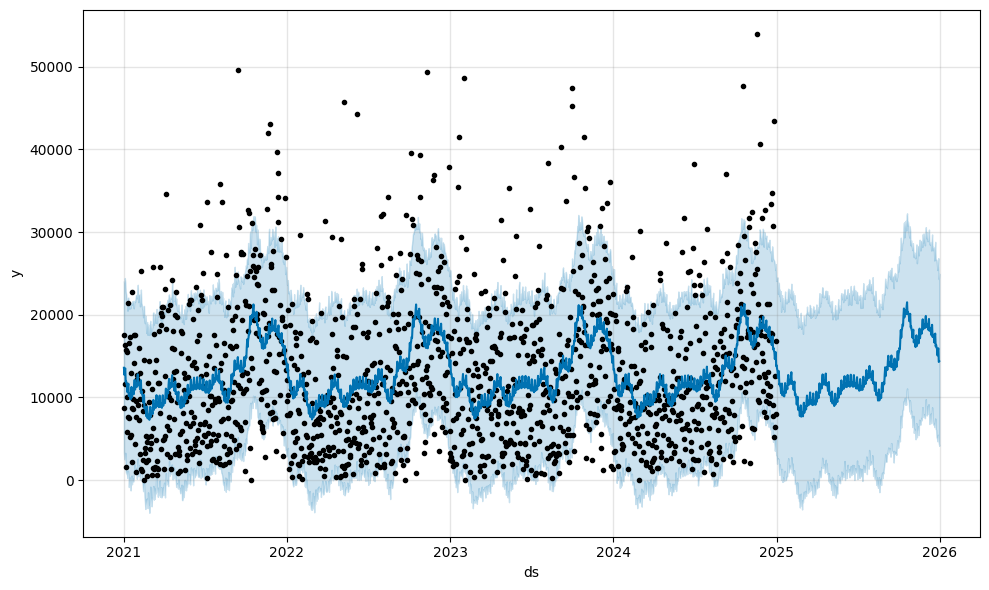

In [124]:
fig1 = m.plot(forecast)

/home/oscar/escola/python_django/vendas/.venv/lib/python3.10/site-packages/prophet/plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/home/oscar/escola/python_django/vendas/.venv/lib/python3.10/site-packages/prophet/plot.py:351: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  df_y['ds'].dt.to_pydatetime(), seas[name], ls='-', c='#0072B2')
/home/oscar/escola/python_django/vendas/.venv/lib/python3.10/site-packages/prophet/plot.py:354: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Serie

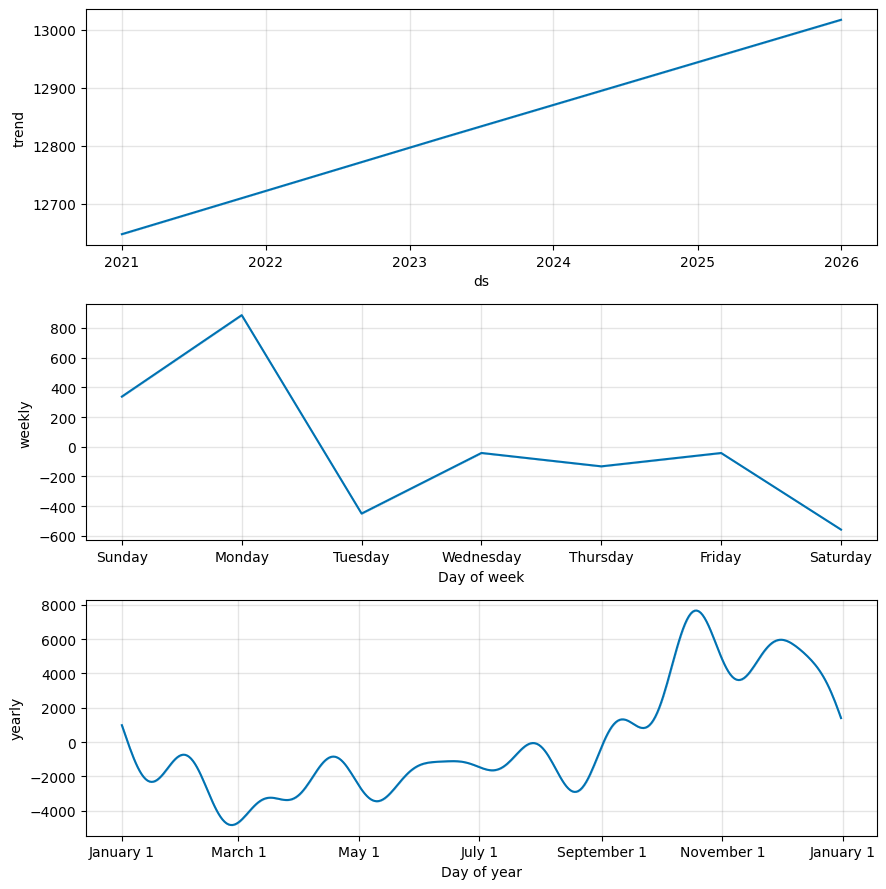

In [125]:
fig2 = m.plot_components(forecast)